In [42]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import math
import numpy as np

property_listings_df = pd.read_csv('data/property_listings.csv')

# Objective 1: Show room type distribution to understand market distribution
# get room type distribution for each city
room_type_by_market_df = property_listings_df.groupby(['city', 'room_type']).size()
room_type_by_market_df = room_type_by_market_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
room_type_by_market_df = room_type_by_market_df.reset_index()
room_type_by_market_df.rename(columns={0: 'pct'}, inplace=True)
# remove rows that are less than 10 pct
room_type_by_market_df = room_type_by_market_df.drop(room_type_by_market_df[room_type_by_market_df.pct < 10].index)
room_type_by_market_df.reset_index(drop=True, inplace=True)
room_type_by_market_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))
room_type_by_market_df.to_csv(r'data/room_type_distribution.csv', index = False)

# Plot room type distribution
room_type_by_market_df.groupby(['room_type']).size()
fig = px.bar(room_type_by_market, x="pct", y="city", color="room_type", orientation='h',
            title="Room Type Distribution", labels={"city": "City", "pct": "Percentage", "room_type": "Room Type"},
            color_discrete_sequence=["#3d5a80", "#ee6c4d"])
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
fig.show()
room_type_by_market_df

,city,room_type,pct
2,Dallas,Entire home/apt,83.0
0,Arlington,Entire home/apt,76.0
6,Fort-Worth,Entire home/apt,76.0
16,Plano,Entire home/apt,68.0
14,McKinney,Entire home/apt,63.0
8,Frisco,Entire home/apt,61.0
12,Irving,Entire home/apt,56.0
4,Denton,Entire home/apt,52.0
11,Grand Prairie,Private room,51.0
18,Richardson,Entire home/apt,51.0


In [34]:
# Objective 2: Show property type distribution also to better understand market distribution
# get property type distribution for each city
property_type_df = property_listings_df.groupby(['city', 'property_type']).size()
property_type_df = property_type_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
property_type_df = property_type_df.reset_index()
property_type_df.rename(columns={0: 'pct'}, inplace=True)
# remove rows that are less than 10 pct
property_type_df = property_type_df.drop(property_type_df[property_type_df.pct < 10].index)
property_type_df.reset_index(drop=True, inplace=True)
property_type_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))

# Plot property type distribution
property_type_df.groupby(['property_type']).size()
fig = px.bar(property_type_df, x="pct", y="city", color="property_type", orientation='h',
            title="Property Type Distribution",
            labels={"city": "City", "pct": "Percentage", "property_type": "Property Type"},
            color_discrete_sequence=["#5390d9", "#6b818c"]
            )
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
fig.show()
property_type_df
#QUESTION: How do I highlight Dallas apartment bar?

,city,property_type,pct
11,Grand Prairie,House,77.0
9,Frisco,House,70.0
19,Richardson,House,62.0
15,McKinney,House,60.0
5,Denton,House,59.0
1,Arlington,House,55.0
2,Dallas,Apartment,49.0
13,Irving,House,48.0
17,Plano,House,48.0
7,Fort-Worth,House,46.0


In [31]:
# Objective 3: Show market occupancy rate
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')
occupancy_rate_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
occupancy_rate_df.sort_values(["Occupancy Rate %", "Market"], inplace=True, ascending = (False, True))
occupancy_rate_df.rename(columns={"Occupancy Rate %": "occupancy_rate"}, inplace=True)

# property_type_df.groupby(['property_type']).size()
fig = px.bar(occupancy_rate_df, x="occupancy_rate", y="Market", orientation='h',
            title="Annual Occupancy Rate",
            labels={"Market": "City", "occupancy_rate": "Occupancy Rate"},
             color_discrete_sequence=["#83c5be"]
            )
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)

fig.show()
occupancy_rate_df
#QUESTION: How do I add the percentage value at the tip of the bar?

,Market,occupancy_rate
3,Irving,67
0,Dallas,65
7,McKinney,65
9,Richardson,65
5,Frisco,61
6,Grand Prairie,61
2,Plano,61
8,Denton,60
1,Fort-Worth,58
4,Arlington,56


In [37]:
# Objective 4: Show annual gross revenue (adr * occupancy_rate * 365 days) by room type
property_listings_df = pd.read_csv('data/property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

property_listings_df = property_listings_df.filter(['room_type', 'city', 'average_daily_rate'])
property_listings_df['average_daily_rate'] = property_listings_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
property_listings_df = property_listings_df.groupby(['room_type', 'city']).mean().round().reset_index()

entire_home_df = property_listings_df[property_listings_df['room_type'] == 'Entire home/apt']
private_rm_df = property_listings_df[property_listings_df['room_type'] == 'Private room']
property_listings_df = entire_home_df.append(private_rm_df)

property_listings_df = pd.merge(property_listings_df, airdna_stats_df, on='city')
property_listings_df['annual_gross_revenue'] = (property_listings_df.average_daily_rate * (property_listings_df.occupancy_rate/100) * 365).round()

room_type_by_market_df = pd.read_csv('data/room_type_distribution.csv')
room_type_with_market_share_df = pd.merge(property_listings_df, room_type_by_market_df, left_on=['city','room_type'], right_on = ['city','room_type'])
room_type_with_market_share_df['adj_annual_gross_revenue'] = (room_type_with_market_share_df.average_daily_rate * (room_type_with_market_share_df.occupancy_rate/100) * (room_type_with_market_share_df.pct/100) * 365).round()
room_type_with_market_share_df.sort_values(["adj_annual_gross_revenue", "city"], inplace=True, ascending = (False, True))
room_type_with_market_share_df

fig = px.bar(room_type_with_market_share_df, x="adj_annual_gross_revenue", y="city", color="room_type", orientation='h',
             title="Annual Gross Revenue By Room Type",
             labels={"city": "City", "room_type": "Room Type", 
                     "adj_annual_gross_revenue": "Adjusted Annual Gross Revenue"},
             color_discrete_sequence=["#3d5a80", "#ee6c4d"]
            )
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    tickprefix="$", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
fig.show()
room_type_with_market_share_df

,room_type,city,average_daily_rate,occupancy_rate,annual_gross_revenue,pct,adj_annual_gross_revenue
2,Entire home/apt,Dallas,156.0,65,37011.0,83.0,30719.0
0,Entire home/apt,Arlington,176.0,56,35974.0,76.0,27341.0
16,Entire home/apt,Plano,167.0,61,37183.0,68.0,25284.0
6,Entire home/apt,Fort-Worth,157.0,58,33237.0,76.0,25260.0
14,Entire home/apt,McKinney,163.0,65,38672.0,63.0,24363.0
8,Entire home/apt,Frisco,175.0,61,38964.0,61.0,23768.0
12,Entire home/apt,Irving,160.0,67,39128.0,56.0,21912.0
18,Entire home/apt,Richardson,156.0,65,37011.0,51.0,18876.0
10,Entire home/apt,Grand Prairie,161.0,61,35847.0,48.0,17206.0
4,Entire home/apt,Denton,126.0,60,27594.0,52.0,14349.0


In [39]:
# Objective 5: Show annual gross revenue VS Adjusted traditional rental revenue (grouped by room type)
room_type_with_market_share_df.sort_values(["city"], inplace=True, ascending = (True))
traditional_annual_rental_revenue = pd.read_csv('data/traditional_annual_rental_revenue.csv')


fig = px.bar(room_type_with_market_share_df, y="adj_annual_gross_revenue", x="city", color="room_type",
             title="Annual Gross Revenue By Room Type",
             labels={"city": "City", "room_type": "Room Type", 
                     "adj_annual_gross_revenue": "Adjusted Annual Gross Revenue"},
             color_discrete_sequence=["#3d5a80", "#ee6c4d"]
            )
trace1 = go.Scatter(x=traditional_annual_rental_revenue["Market"], y=traditional_annual_rental_revenue["adjusted_annual_revenue"],
                    name='Adjusted Traditional Rental Revenue')
fig.update_layout(barmode='group')
fig.update_yaxes(
    tickprefix="$", showgrid=True
)
fig.add_trace(trace1)
fig.show()
room_type_with_market_share_df
traditional_annual_rental_revenue


# fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms", 
#              title="Annual Revenue Forecast By # of Bedrooms",
#              labels={"city": "City", "bedrooms": "Bedrooms", 
#                      "annual_gross_revenue": "Revenue"},
#              color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
#              category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]}
#             )
# fig.update_layout(barmode='group')
# fig.update_yaxes(
#     tickprefix="$", showgrid=True
# )
# trace_1_bd = go.Scatter(x=all_dfw_df["Market"], y=all_dfw_df["adjusted_annual_revenue"],
#                     name='Adjusted Traditional Rental Revenue')
# # trace0 = go.Scatter(x=dfw_studio["Market"], y=dfw_studio["adjusted_annual_revenue"],
# #                                name='Trad Studio', line = dict(color='#264653'))
# # trace1 = go.Scatter(x=dfw_1_bedroom["Market"], y=dfw_1_bedroom["adjusted_annual_revenue"],
# #                                name='Trad 1', line = dict(color='#2a9d8f'))

# fig.add_trace(trace_1_bd)
# # fig.add_trace(trace1)
# fig.show()

,Market,adjusted_annual_revenue
0,Arlington,8659.504
1,Dallas,12549.810
2,Denton,9807.480
3,Fort-Worth,9644.356
4,Frisco,12226.230
5,Grand Prairie,10537.994
6,Irving,12715.394
7,McKinney,11470.030
8,Plano,12014.072
9,Richardson,12373.400


In [40]:
# Objective 6: Show annual gross revenue (adr * occupancy_rate * 365 days) by property type
property_listings_df = pd.read_csv('data/property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

property_listings_df = property_listings_df.filter(['property_type', 'city', 'average_daily_rate'])
property_listings_df['average_daily_rate'] = property_listings_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
property_listings_df = property_listings_df.groupby(['property_type', 'city']).mean().round().reset_index()

apartments_df = property_listings_df[property_listings_df['property_type'] == 'Apartment']
houses_df = property_listings_df[property_listings_df['property_type'] == 'House']
property_listings_df = houses_df.append(apartments_df)

property_listings_df = pd.merge(property_listings_df, airdna_stats_df, on='city')
property_listings_df['annual_gross_revenue'] = (property_listings_df.average_daily_rate * (property_listings_df.occupancy_rate/100) * 365).round()
property_listings_df.sort_values(["annual_gross_revenue", "city"], inplace=True, ascending = (False, True))

# room_type_by_market_df = pd.read_csv('data/room_type_distribution.csv')
# room_type_with_market_share_df = pd.merge(property_listings_df, room_type_by_market_df, left_on=['city','room_type'], right_on = ['city','room_type'])
# room_type_with_market_share_df['adj_annual_gross_revenue'] = (room_type_with_market_share_df.average_daily_rate * (room_type_with_market_share_df.occupancy_rate/100) * (room_type_with_market_share_df.pct/100) * 365).round()
# room_type_with_market_share_df.sort_values(["adj_annual_gross_revenue", "city"], inplace=True, ascending = (False, True))
# room_type_with_market_share_df

fig = px.bar(property_listings_df, x="annual_gross_revenue", y="city", color="property_type", orientation='h',
            title="Annual Gross Revenue By Property Type",
             labels={"city": "City", "pct": "Percentage", "property_type": "Property Type", 
                     "annual_gross_revenue": "Annual Gross Revenue"},
            color_discrete_sequence=["#5390d9", "#6b818c"]
            )
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    tickprefix="$", showgrid=True
)
# fig.show()

# DGitonga 8/20/20 This chart creates some confusion
# If you look at the Market Property Type Distribution chart, it shows Dallas has 49% apartments and 24% houses which means
# there more demand for apartments than there is houses, however this chart suggests that houses can potentially make more
# money in Dallas, which is contradictory.

In [45]:
# Objective 7: Bedroom market share
property_listings_df = pd.read_csv('data/property_listings.csv')
property_listings_df = property_listings_df.drop(property_listings_df[property_listings_df.bedrooms > 5].index)
property_listings_df = property_listings_df.groupby(['city', 'bedrooms']).size().to_frame('market_share')

# Save market share csv
property_listings_df2 = property_listings_df.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))
property_listings_df2 = property_listings_df2.reset_index()
property_listings_df2.to_csv(r'data/dfw_bedroom_market_share.csv', index = False)
# property_listings_df2

property_listings_df = property_listings_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
# property_listings_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))
property_listings_df = property_listings_df.reset_index()
# property_listings_df = property_listings_df[property_listings_df['pct'] > 11]
property_listings_df['bedrooms'] = property_listings_df['bedrooms'].astype(str).replace('0', 'Studio')
fig = px.bar(property_listings_df, x="market_share", y="city", color="bedrooms", orientation='h',
             title="Bedroom Market Share",
             labels={"city": "City", "bedrooms": "Bedrooms", "market_share":"Market Share"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
            )
# fig.update_layout(barmode='stack')
# fig['layout']['yaxis']['autorange'] = "reversed"
# fig.update_xaxes(
#     ticksuffix="%", showgrid=True
# )
fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
        ticksuffix="%", showgrid=True
    ),
    yaxis=dict(
        titlefont_size=16,
        autorange="reversed"
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='stack',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()
property_listings_df

,city,bedrooms,market_share
0,Arlington,Studio,4.0
1,Arlington,1,46.0
2,Arlington,2,18.0
3,Arlington,3,19.0
4,Arlington,4,9.0
5,Arlington,5,4.0
6,Dallas,Studio,7.0
7,Dallas,1,61.0
8,Dallas,2,19.0
9,Dallas,3,8.0


In [56]:
# Objective 8: Revenue forecast by # of bedrooms
import pandas as pd
import plotly.express as px

property_listings_df = pd.read_csv('data/property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')
bedroom_market_share_df = pd.read_csv('data/dfw_bedroom_market_share.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

market_share_df = property_listings_df.filter(['bedrooms', 'city', 'average_daily_rate'])
market_share_df['average_daily_rate'] = market_share_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
market_share_df = market_share_df.groupby(['bedrooms', 'city']).mean().round().reset_index()
market_share_df = market_share_df.drop(market_share_df[market_share_df.bedrooms > 5].index)
market_share_df = pd.merge(market_share_df, bedroom_market_share_df, left_on=['city','bedrooms'], right_on = ['city','bedrooms'])
market_share_df = pd.merge(market_share_df, airdna_stats_df, on='city')
market_share_df.rename(columns={"pct": "market_share"}, inplace=True)
market_share_df['annual_gross_revenue'] = (market_share_df.average_daily_rate * (market_share_df.market_share/100) * (market_share_df.occupancy_rate/100) * 365).round()
market_share_df['bedrooms'] = market_share_df['bedrooms'].astype(str).replace('0', 'Studio')
fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms", 
             title="Annual Revenue Forecast By # of Bedrooms",
             labels={"city": "City", "bedrooms": "Bedrooms", 
                     "annual_gross_revenue": "Revenue"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
             category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]}
            )
fig.update_layout(barmode='group')
# fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_yaxes(
#     tickprefix="$", showgrid=True
)
fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
    ),
    yaxis=dict(
        titlefont_size=16,
        tickprefix="$", showgrid=True
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()
market_share_df
# market_share_df.sort_values(["annual_gross_revenue", "city"], inplace=True, ascending = (False, True))

,bedrooms,city,average_daily_rate,market_share,occupancy_rate,annual_gross_revenue
0,Studio,Arlington,97.0,3.561254,56,706.0
1,1,Arlington,66.0,46.153846,56,6226.0
2,2,Arlington,125.0,18.376068,56,4695.0
3,3,Arlington,202.0,18.803419,56,7764.0
4,4,Arlington,286.0,8.974359,56,5246.0
5,5,Arlington,477.0,4.131054,56,4028.0
6,Studio,Dallas,84.0,7.316294,65,1458.0
7,1,Dallas,82.0,61.437700,65,11952.0
8,2,Dallas,161.0,19.329073,65,7383.0
9,3,Dallas,254.0,7.795527,65,4698.0


In [57]:
# Time series forecast for traditional rental prices
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')
occupancy_rate_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
occupancy_rate_df.sort_values(["Occupancy Rate %", "Market"], inplace=True, ascending = (False, True))
occupancy_rate_df.rename(columns={"Occupancy Rate %": "occupancy_rate"}, inplace=True)

dfw_studio = pd.read_csv('data/zillow_rental_datasets/DFW_MedianRentalPrice_Studio.csv')
dfw_studio = pd.merge(dfw_studio, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_studio["Last 12 Month Avg"].mean()
dfw_studio["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_studio['annual_revenue'] = round(dfw_studio['Last 12 Month Avg'] * 12)
dfw_studio['adjusted_annual_revenue'] = dfw_studio['annual_revenue'] * (dfw_studio['occupancy_rate']/100)
dfw_studio.sort_values(["Market"], inplace=True, ascending = (True))
dfw_studio

# trace0 = go.Scatter(x=dfw_studio["Market"], y=dfw_studio["adjusted_annual_revenue"],
#                                name='Trad Studio', line = dict(color='#264653'))
# trace1 = go.Scatter(x=dfw_1_bedroom["Market"], y=dfw_1_bedroom["adjusted_annual_revenue"],
#                                name='Trad 1', line = dict(color='#2a9d8f'))
# data = [trace0, trace1]
# fig = go.Figure(data=data)
# fig.update_layout(showlegend=True)
# fig.show()

# fig = go.Figure(data=go.Scatter(x=dfw_1_bedroom["RegionName"], y=dfw_1_bedroom["adjusted_annual_revenue"],
#                                name='Trad 1', line = dict(color='#2a9d8f')))
# fig.update_layout(showlegend=True)
# fig.show()

,RegionName,State,Metro,CountyName,SizeRank,2011-01,2011-02,2011-03,2011-04,2011-05,...,2017-05,2017-06,2017-07,2017-08,2017-09,Last 12 Month Avg,Market,occupancy_rate,annual_revenue,adjusted_annual_revenue
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Arlington,56,16592.0,9291.52
0,Dallas,TX,Dallas-Fort Worth,Dallas,8.0,895.0,785.0,830.0,800.0,800.0,...,1165.0,1170.0,1190.0,1230.0,1239.0,1176.500,Dallas,65,14118.0,9176.70
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Denton,60,16592.0,9955.20
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Fort-Worth,58,16592.0,9623.36
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Frisco,61,16592.0,10121.12
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Grand Prairie,61,16592.0,10121.12
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Irving,67,16592.0,11116.64
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,McKinney,65,16592.0,10784.80
1,Plano,TX,Dallas-Fort Worth,Collin,43.0,NaN,NaN,NaN,NaN,NaN,...,1580.0,1600.0,1625.0,1645.0,1600.0,1588.750,Plano,61,19065.0,11629.65
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1382.625,Richardson,65,16592.0,10784.80


In [49]:
# dfw_1_bedroom["adjusted_annual_revenue"].mean()
dfw_1_bedroom = pd.read_csv('data/zillow_rental_datasets/DFW_MedianRentalPrice_1Bedroom.csv')
dfw_1_bedroom = pd.merge(dfw_1_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
dfw_1_bedroom['annual_revenue'] = round(dfw_1_bedroom['Last 12 Month Avg'] * 12)
dfw_1_bedroom['adjusted_annual_revenue'] = dfw_1_bedroom['annual_revenue'] * (dfw_1_bedroom['occupancy_rate']/100)
dfw_1_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_1_bedroom

,RegionName,State,Metro,CountyName,SizeRank,2011-03,2011-04,2011-05,2011-06,2011-07,...,2017-05,2017-06,2017-07,2017-08,2017-09,Last 12 Month Avg,Market,occupancy_rate,annual_revenue,adjusted_annual_revenue
2,Arlington,TX,Dallas-Fort Worth,Tarrant,46.0,NaN,NaN,NaN,NaN,NaN,...,904.5,976.0,980.0,960.0,908.5,873.208333,Arlington,56,10478.0,5867.68
0,Dallas,TX,Dallas-Fort Worth,Dallas,10.0,1040.5,1000.0,975.0,995.0,975.0,...,1310.0,1319.0,1325.0,1350.0,1327.0,1297.583333,Dallas,65,15571.0,10121.15
8,Denton,TX,Dallas-Fort Worth,Denton,148.0,NaN,NaN,NaN,NaN,NaN,...,885.0,861.0,840.0,885.0,878.0,851.125000,Denton,60,10214.0,6128.40
1,Fort-Worth,TX,Dallas-Fort Worth,Tarrant,16.0,NaN,NaN,NaN,NaN,NaN,...,1169.0,1214.0,1209.0,1219.5,1220.0,1107.166667,Fort-Worth,58,13286.0,7705.88
7,Frisco,TX,Dallas-Fort Worth,Collin,139.0,NaN,NaN,NaN,NaN,NaN,...,1195.0,1194.0,1175.0,1195.0,1220.0,1194.333333,Frisco,61,14332.0,8742.52
5,Grand Prairie,TX,Dallas-Fort Worth,Dallas,103.0,NaN,NaN,NaN,NaN,NaN,...,909.0,925.0,904.5,952.0,952.0,920.333333,Grand Prairie,61,11044.0,6736.84
4,Irving,TX,Dallas-Fort Worth,Dallas,83.0,NaN,NaN,NaN,NaN,NaN,...,1167.0,1179.0,1247.0,1157.0,1070.0,1143.625000,Irving,67,13724.0,9195.08
6,McKinney,TX,Dallas-Fort Worth,Collin,130.0,NaN,NaN,NaN,NaN,NaN,...,1025.0,1020.0,1021.0,1005.0,1030.0,990.291667,McKinney,65,11884.0,7724.60
3,Plano,TX,Dallas-Fort Worth,Collin,62.0,NaN,NaN,794.0,799.0,796.5,...,1129.0,1170.0,1155.0,1155.5,1151.0,1125.833333,Plano,61,13510.0,8241.10
9,Richardson,TX,Dallas-Fort Worth,Dallas,168.0,NaN,NaN,NaN,NaN,NaN,...,1310.0,1350.0,1333.0,1335.0,1335.0,1286.458333,Richardson,65,15437.0,10034.05


In [50]:
dfw_2_bedroom = pd.read_csv('data/zillow_rental_datasets/DFW_MedianRentalPrice_2Bedroom.csv')
dfw_2_bedroom = pd.merge(dfw_2_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_2_bedroom["Last 12 Month Avg"].mean()
dfw_2_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_2_bedroom['annual_revenue'] = round(dfw_2_bedroom['Last 12 Month Avg'] * 12)
dfw_2_bedroom['adjusted_annual_revenue'] = dfw_2_bedroom['annual_revenue'] * (dfw_2_bedroom['occupancy_rate']/100)
dfw_2_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_2_bedroom

,RegionName,State,Metro,CountyName,SizeRank,2011-02,2011-03,2011-04,2011-05,2011-06,...,2017-05,2017-06,2017-07,2017-08,2017-09,Last 12 Month Avg,Market,occupancy_rate,annual_revenue,adjusted_annual_revenue
2,Arlington,TX,Dallas-Fort Worth,Tarrant,49.0,750.0,786.0,750.0,730.0,750.0,...,1095.0,1127.0,1115.0,1150.0,1165.0,1059.708333,Arlington,56,12716.0,7120.96
0,Dallas,TX,Dallas-Fort Worth,Dallas,10.0,NaN,NaN,NaN,NaN,NaN,...,1775.0,1802.0,1821.0,1845.0,1795.0,1743.416667,Dallas,65,20921.0,13598.65
7,Denton,TX,Dallas-Fort Worth,Denton,199.0,NaN,NaN,NaN,NaN,NaN,...,1200.0,1177.0,1195.0,1095.0,999.0,1149.833333,Denton,60,13798.0,8278.80
1,Fort-Worth,TX,Dallas-Fort Worth,Tarrant,16.0,NaN,NaN,NaN,NaN,NaN,...,1365.0,1425.0,1400.0,1417.5,1368.0,1289.958333,Fort-Worth,58,15479.0,8977.82
6,Frisco,TX,Dallas-Fort Worth,Collin,186.0,NaN,NaN,NaN,NaN,NaN,...,1644.0,1641.0,1619.0,1650.0,1650.0,1622.291667,Frisco,61,19468.0,11875.48
4,Irving,TX,Dallas-Fort Worth,Dallas,97.0,NaN,NaN,NaN,NaN,NaN,...,1510.0,1509.0,1535.0,1555.0,1470.0,1496.791667,Irving,67,17962.0,12034.54
5,McKinney,TX,Dallas-Fort Worth,Collin,170.0,NaN,NaN,NaN,NaN,NaN,...,1350.0,1326.0,1307.5,1398.0,1444.0,1339.916667,McKinney,65,16079.0,10451.35
3,Plano,TX,Dallas-Fort Worth,Collin,67.0,NaN,1140.5,999.0,1070.0,1062.5,...,1535.0,1589.0,1570.0,1566.0,1550.0,1513.833333,Plano,61,18166.0,11081.26
8,Richardson,TX,Dallas-Fort Worth,Dallas,236.0,NaN,NaN,NaN,952.0,999.0,...,1645.0,1750.0,1790.0,1750.0,1750.0,1598.083333,Richardson,65,19177.0,12465.05
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1423.759259,Grand Prairie,61,17085.0,10421.85


In [51]:
dfw_3_bedroom = pd.read_csv('data/zillow_rental_datasets/DFW_MedianRentalPrice_3Bedroom.csv')
dfw_3_bedroom = pd.merge(dfw_3_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_3_bedroom["Last 12 Month Avg"].mean()
dfw_3_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_3_bedroom['annual_revenue'] = round(dfw_3_bedroom['Last 12 Month Avg'] * 12)
dfw_3_bedroom['adjusted_annual_revenue'] = dfw_3_bedroom['annual_revenue'] * (dfw_3_bedroom['occupancy_rate']/100)
dfw_3_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_3_bedroom

,RegionName,State,Metro,CountyName,SizeRank,2010-12,2011-01,2011-02,2011-03,2011-04,...,2017-05,2017-06,2017-07,2017-08,2017-09,Last 12 Month Avg,Market,occupancy_rate,annual_revenue,adjusted_annual_revenue
2,Arlington,TX,Dallas-Fort Worth,Tarrant,49.0,NaN,1200.0,1195.0,1195.0,1200.0,...,1495.0,1500.0,1500.0,1475.0,1495.0,1441.958333,Arlington,56,17303.0,9689.68
0,Dallas,TX,Dallas-Fort Worth,Dallas,10.0,1285.0,1395.0,1250.0,1295.0,1395.0,...,2000.0,2100.0,1995.0,1945.0,1913.0,1825.541667,Dallas,65,21907.0,14239.55
8,Denton,TX,Dallas-Fort Worth,Denton,203.0,NaN,NaN,1150.0,1197.5,1237.5,...,1495.0,1495.0,1495.0,1495.0,1395.0,1462.958333,Denton,60,17555.0,10533.00
1,Fort-Worth,TX,Dallas-Fort Worth,Tarrant,16.0,NaN,NaN,1195.0,1195.0,1195.5,...,1495.0,1500.0,1500.0,1495.0,1497.5,1451.458333,Fort-Worth,58,17417.0,10101.86
7,Frisco,TX,Dallas-Fort Worth,Collin,191.0,NaN,NaN,1450.0,1400.0,1475.0,...,1899.0,1932.0,1897.0,1859.5,1895.0,1852.333333,Frisco,61,22228.0,13559.08
5,Grand Prairie,TX,Dallas-Fort Worth,Dallas,138.0,NaN,NaN,1175.0,1300.0,1297.5,...,1503.0,1575.0,1565.0,1525.0,1535.0,1507.125000,Grand Prairie,61,18086.0,11032.46
4,Irving,TX,Dallas-Fort Worth,Dallas,100.0,NaN,1597.5,1500.0,1337.5,1300.0,...,2050.0,2050.0,2065.0,1995.0,2042.5,1920.250000,Irving,67,23043.0,15438.81
6,McKinney,TX,Dallas-Fort Worth,Collin,177.0,NaN,NaN,1300.0,1350.0,1380.0,...,1750.0,1750.0,1750.0,1750.0,1700.0,1714.500000,McKinney,65,20574.0,13373.10
3,Plano,TX,Dallas-Fort Worth,Collin,69.0,NaN,NaN,1495.0,1459.0,1485.0,...,1850.0,1850.0,1877.5,1850.0,1810.5,1802.083333,Plano,61,21625.0,13191.25
9,Richardson,TX,Dallas-Fort Worth,Dallas,243.0,NaN,NaN,NaN,NaN,NaN,...,1700.0,1764.0,1795.0,1769.5,1750.0,1700.333333,Richardson,65,20404.0,13262.60


In [52]:
dfw_4_bedroom = pd.read_csv('data/zillow_rental_datasets/DFW_MedianRentalPrice_4Bedroom.csv')
dfw_4_bedroom = pd.merge(dfw_4_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_4_bedroom["Last 12 Month Avg"].mean()
dfw_4_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_4_bedroom['annual_revenue'] = round(dfw_4_bedroom['Last 12 Month Avg'] * 12)
dfw_4_bedroom['adjusted_annual_revenue'] = dfw_4_bedroom['annual_revenue'] * (dfw_4_bedroom['occupancy_rate']/100)
dfw_4_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_4_bedroom

,RegionName,State,Metro,CountyName,SizeRank,2011-01,2011-02,2011-03,2011-04,2011-05,...,2017-05,2017-06,2017-07,2017-08,2017-09,Last 12 Month Avg,Market,occupancy_rate,annual_revenue,adjusted_annual_revenue
2,Arlington,TX,Dallas-Fort Worth,Tarrant,33.0,NaN,NaN,NaN,NaN,NaN,...,1740.0,1750.0,1795.0,1750.0,1700.0,1685.708333,Arlington,56,20228.0,11327.68
0,Dallas,TX,Dallas-Fort Worth,Dallas,8.0,NaN,NaN,NaN,NaN,NaN,...,2200.0,2447.5,2300.0,2350.0,2300.0,2001.625000,Dallas,65,24020.0,15613.00
1,Fort-Worth,TX,Dallas-Fort Worth,Tarrant,14.0,1262.5,1350.0,1350.0,1395.0,1350.0,...,1730.0,1745.0,1750.0,1775.0,1795.0,1697.250000,Fort-Worth,58,20367.0,11812.86
5,Frisco,TX,Dallas-Fort Worth,Collin,86.0,NaN,2100.0,2000.0,2000.0,2000.0,...,2320.0,2350.0,2350.0,2350.0,2350.0,2299.583333,Frisco,61,27595.0,16832.95
4,McKinney,TX,Dallas-Fort Worth,Collin,80.0,NaN,1595.0,1595.0,1650.0,1595.0,...,1975.0,1907.5,1895.0,1950.0,1900.0,1925.166667,McKinney,65,23102.0,15016.30
3,Plano,TX,Dallas-Fort Worth,Collin,41.0,NaN,1825.0,1795.0,1800.0,1850.0,...,2200.0,2250.0,2200.0,2195.0,2200.0,2175.833333,Plano,61,26110.0,15927.10
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1964.194444,Irving,67,23570.0,15791.90
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1964.194444,Richardson,65,23570.0,15320.50
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1964.194444,Grand Prairie,61,23570.0,14377.70
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1964.194444,Denton,60,23570.0,14142.00


In [53]:
# dfw_rental_df = dfw_1_bedroom["adjusted_annual_revenue"].mean()
# Arlington_rentals = dfw_1_bedroom['Market'] == 'Arlington'
# Arlington_rentals = dfw_1_bedroom.loc[Arlington_rentals, 'adjusted_annual_revenue'].mean()
# Arlington_rentals = dfw_1_bedroom['Market'] == 'Arlington'
# Arlington_rentals = dfw_1_bedroom.loc[Arlington_rentals, 'adjusted_annual_revenue'].mean()
# Arlington_rentals
dfw_studio['bedrooms'] = 'Studio'
dfw_1_bedroom['bedrooms'] = 1
dfw_2_bedroom['bedrooms'] = 2
dfw_3_bedroom['bedrooms'] = 3
dfw_4_bedroom['bedrooms'] = 4
dfw_4_bedroom
all_dfw_df = pd.concat([dfw_studio, dfw_1_bedroom, dfw_2_bedroom, dfw_3_bedroom, dfw_4_bedroom])
all_dfw_df = all_dfw_df.filter(['Market', 'adjusted_annual_revenue', 'bedrooms'])
all_dfw_df

,Market,adjusted_annual_revenue,bedrooms
9,Arlington,9291.52,Studio
0,Dallas,9176.70,Studio
7,Denton,9955.20,Studio
8,Fort-Worth,9623.36,Studio
5,Frisco,10121.12,Studio
6,Grand Prairie,10121.12,Studio
2,Irving,11116.64,Studio
3,McKinney,10784.80,Studio
1,Plano,11629.65,Studio
4,Richardson,10784.80,Studio


In [54]:
all_dfw_df = all_dfw_df.groupby(['Market']).mean().reset_index()
all_dfw_df.to_csv(r'data/traditional_annual_rental_revenue.csv', index = False)
all_dfw_df

,Market,adjusted_annual_revenue
0,Arlington,8659.504
1,Dallas,12549.810
2,Denton,9807.480
3,Fort-Worth,9644.356
4,Frisco,12226.230
5,Grand Prairie,10537.994
6,Irving,12715.394
7,McKinney,11470.030
8,Plano,12014.072
9,Richardson,12373.400


In [55]:
# Objective 9: traditional rental income vs short term rental income
# Create traces
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=random_x, y=random_y0,
#                     mode='lines',
#                     name='lines'))
# fig.add_trace(go.Scatter(x=RegionName, y=random_y1,
#                     mode='lines+markers',
#                     name='lines+markers'))
# fig.add_trace(go.Scatter(x=random_x, y=random_y2,
#                     mode='markers', name='markers'))
# fig = px.scatter(dfw_1_bedroom, x="RegionName", y="adjusted_annual_revenue")
# fig = go.Figure()
# # 1 bedroom 


# airbnb
fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms", 
             title="Annual Revenue Forecast By # of Bedrooms",
             labels={"city": "City", "bedrooms": "Bedrooms", 
                     "annual_gross_revenue": "Revenue"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
             category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]}
            )
fig.update_layout(barmode='group')
# fig.update_layout(showlegend=False)
fig.update_yaxes(
    tickprefix="$", showgrid=True
)
trace_1_bd = go.Scatter(x=all_dfw_df["Market"], y=all_dfw_df["adjusted_annual_revenue"],
                    name='Traditional Rental Revenue')
# trace0 = go.Scatter(x=dfw_studio["Market"], y=dfw_studio["adjusted_annual_revenue"],
#                                name='Trad Studio', line = dict(color='#264653'))
# trace1 = go.Scatter(x=dfw_1_bedroom["Market"], y=dfw_1_bedroom["adjusted_annual_revenue"],
#                                name='Trad 1', line = dict(color='#2a9d8f'))

fig.add_trace(trace_1_bd)
fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
    ),
    yaxis=dict(
        titlefont_size=16,
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
# fig.add_trace(trace1)
fig.show()



# fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms",
#                 title="Annual Revenue Forecast By # of Bedrooms",
#                 labels={"city": "City", "bedrooms": "Bedrooms", "annual_gross_revenue": "Revenue"},
#                 color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
#                 category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]})

# fig.show()


# fig.update_layout(barmode='group')
# fig.update_yaxes(
#     tickprefix="$", showgrid=True
# )


# fig.add_bar(trace_1_bd)
# fig.show()


# data = [trace1, trace2]
# fig = go.Figure(data=data)
# fig.show()

In [58]:
# Objective 10: Show quarterly growth
import pandas as pd
import plotly.graph_objects as go

airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')
airdna_stats_df

# import pandas as pd
# import plotly.express as px
# import plotly.offline as ofl
# import plotly.graph_objs as go
# import matplotlib.pyplot as plt
# import numpy as np

# airdna_market_stats = 'data/airdna_dfw_market_stats.csv'
# df = pd.read_csv(airdna_market_stats)

# x = df['Market']
# y = df['Occupancy Rate %']
# y1 = df['Entire Home Rentals']
# y2 = df['Q1 19']
# y3 = df['Q2 19']
# y4 = df['Q3 19']
# y5 = df['Q4 19']
# y6 = df['Q1 20']
# y7 = df['Q2 20']

# # Create trace 1 for Corp_A

# trace1 = go.Bar(
#     x=x,
#     y=y2,
#     name='2019 Q1'
# )
# trace2 = go.Bar(
#     x=x,
#     y=y3,
#     name='2019 Q2'
# )


# trace3= go.Bar(
#     x=x,
#     y=y6,
#     name='2020 Q1'
# )

# trace4= go.Bar(
#     x=x,
#     y=y7,
#     name='2020 Q2'
# )

# data = [trace1,trace3,trace2,trace4]

# # Create layout object with barmode set to group
# layout = go.Layout(
#     barmode='group'
# )

# # Create figure object and visualize plot
# fig = go.Figure(data=data, layout=layout)
# ofl.iplot(fig, filename='grouped-bar')

,Market,Active Rentals,Rental Demand Score,Average Daily Rate,Occupancy Rate %,Monthly Revenue,Entire Home Rentals,Entire Home Rentals %,Private Room Rentals,Private Room Rentals %,...,Booked Full Time %,Rental Activity Property Count,Accuracy,Check In,Cleanliness,Communication,Location,Value,Overall Rating,Map Url
0,Dallas,3381,85,124,65,1780,2825,84,467,14,...,11.0,2080,4.78,4.79,4.72,4.81,4.83,4.72,4.60,maps/dallas.png
1,Fort-Worth,1055,81,133,58,1782,823,78,220,21,...,13.0,291,4.83,4.83,4.78,4.84,4.86,4.77,4.62,maps/fort-worth.png
2,Plano,441,82,145,61,1840,318,72,122,28,...,9.0,165,4.82,4.84,4.75,4.84,4.93,4.77,4.68,maps/plano.png
3,Irving,390,86,138,67,1785,227,58,131,34,...,7.0,190,4.82,4.84,4.73,4.85,4.86,4.76,4.61,maps/irving.png
4,Arlington,360,69,171,56,2100,283,79,64,18,...,7.0,222,4.81,4.85,4.75,4.87,4.87,4.77,4.66,maps/arlington.png
5,Frisco,188,86,164,61,2165,117,62,71,38,...,9.4,72,4.85,4.87,4.81,4.90,4.92,4.84,4.78,maps/frisco.png
6,Grand Prairie,164,92,142,61,1824,84,51,78,48,...,16.0,54,4.86,4.92,4.81,4.90,4.94,4.82,4.78,maps/grand-prairie.png
7,McKinney,148,92,139,65,1912,99,67,48,32,...,15.0,102,4.88,4.92,4.88,4.92,4.95,4.85,4.82,maps/mckinney.png
8,Denton,123,80,97,60,1500,63,51,58,47,...,17.0,49,4.86,4.92,4.80,4.90,4.91,4.85,4.79,maps/denton.png
9,Richardson,119,94,138,65,1815,65,55,53,45,...,13.0,38,4.82,4.86,4.80,4.86,4.90,4.76,4.68,maps/richardson.png


In [59]:
# Objective: Show quarterly growth
import pandas as pd
import plotly.graph_objects as go

airdna_stats_df = pd.read_csv('data/airdna_dfw_market_stats.csv')
df_2019 = airdna_stats_df.filter(['Market', 'Q1 19', 'Q2 19', 'Q3 19', 'Q4 19', '2019 Growth %', 'Q1 20', 'Q2 20', '2020 Growth %'])
df_2019_dallas = df_2019[df_2019.Market == 'Dallas']
df_2019_cowtown = df_2019[df_2019.Market == 'Fort-Worth']
df_2019_big_city = pd.concat([df_2019_dallas, df_2019_cowtown])
# df_2019 = df_2019[df_2019.Market != 'Dallas']
# df_2019 = df_2019[df_2019.Market != 'Fort-Worth']
# airdna_stats_df
# df_2019 = airdna_stats_df.filter(['Market', 'Q1 19', 'Q2 19', 'Q3 19', 'Q4 19'])
# df_2019 = df_2019.pivot(columns='Market')
df_2019
# df_2020 = airdna_stats_df.filter(['Market','Q1 20', 'Q2 20'])
# df_2020
# df['DataFrame Column'].astype(int)
# df_2019

# df['C'] = df.B.pct_change().mul(100).round(2)

# room_type_with_market_share_df.sort_values(["city"], inplace=True, ascending = (True))
# traditional_annual_rental_revenue = pd.read_csv('data/traditional_annual_rental_revenue.csv')




,Market,Q1 19,Q2 19,Q3 19,Q4 19,2019 Growth %,Q1 20,Q2 20,2020 Growth %
0,Dallas,4353,4589,4928,5182,19,5376,4860,-10
1,Fort-Worth,1073,1166,1261,1420,32,1543,1484,-4
2,Plano,462,530,582,565,22,589,578,-2
3,Irving,396,416,456,478,21,547,534,-2
4,Arlington,514,539,561,580,13,581,513,-12
5,Frisco,243,255,293,276,14,282,247,-12
6,Grand Prairie,143,162,192,205,43,221,218,-1
7,McKinney,200,211,220,244,22,229,205,-10
8,Denton,141,155,176,176,25,188,173,-8
9,Richardson,138,160,196,204,48,208,186,-11


In [ ]:
# df_2019.melt(df_2019, id_vars =['Market'], value_vars =['Q1 19', 'Age']) 

In [60]:
# df_2019_change = df_2019.pct_change(axis='columns')
# df_2019_change
# fig = px.bar(room_type_with_market_share_df, y="adj_annual_gross_revenue", x="city", color="room_type",
#              title="Annual Gross Revenue By Room Type",
#              labels={"city": "City", "room_type": "Room Type", 
#                      "adj_annual_gross_revenue": "Adjusted Annual Gross Revenue"},
#              color_discrete_sequence=["#3d5a80", "#ee6c4d"]
#             )
# fig = px.scatter(df_2019, y="Market", x="Q1 19")
# trace1 = go.Scatter(x=df_2019['Q2 19'], y=df_2019["Market"])
# # fig.update_layout(barmode='group')
# # fig.update_yaxes(
# #     tickprefix="$", showgrid=True
# # )
# fig.add_trace(trace1)
# fig.show()
# room_type_with_market_share_df
# traditional_annual_rental_revenue

# fig = px.bar(df_2019, y="Q1 19", x="Market",
#              title="Annual Revenue Forecast By # of Bedrooms",
#              labels={"city": "City", "bedrooms": "Bedrooms", 
#                      "annual_gross_revenue": "Revenue"},
#              color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
#             )
# fig = go.Figure()
q1_color = '#edae49'
q2_color = '#3da5d9'
q3_color = '#7fb685'
q4_color = '#f4743b'

fig = go.Figure(
    data=[go.Bar(x=df_2019["Market"], y=df_2019['Q1 19'], name='Q1 19', marker_color=q1_color)],
    layout=go.Layout(
        title=go.layout.Title(text="Quarterly Growth"),
    )
)
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q2 19'],
        name='Q2 19', marker_color=q2_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q3 19'],
        name='Q3 19', marker_color=q3_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q4 19'],
        name='Q4 19', marker_color=q4_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q1 20'],
        name='Q1 20', marker_color=q1_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q2 20'],
        name='Q2 20', marker_color=q2_color
    ))
fig.update_layout(
    title='Quarterly Growth',
    xaxis=dict(
        title='Market',
        titlefont_size=16,
    ),
    yaxis=dict(
        title='# of Units Listed',
        titlefont_size=16,
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0.90,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [63]:
# Objective 11: Show density of listings across market
property_listings_df = pd.read_csv('data/property_listings.csv')

fig = px.density_mapbox(property_listings_df, lat='latitude', lon='longitude', radius=3.5,
                        center={'lat': 32.964012, 'lon': -97.043722}, zoom=9.0, height=850, width=950,
                        hover_data=['city', 'average_daily_rate', 'property_type'],
                        labels={"city": "City", "property_type": "Property Type", "average_daily_rate": "Avg Daily Rate"},
                        mapbox_style="open-street-map")
fig.update_layout(showlegend=True)
fig.show()

<function matplotlib.pyplot.show(*args, **kw)>

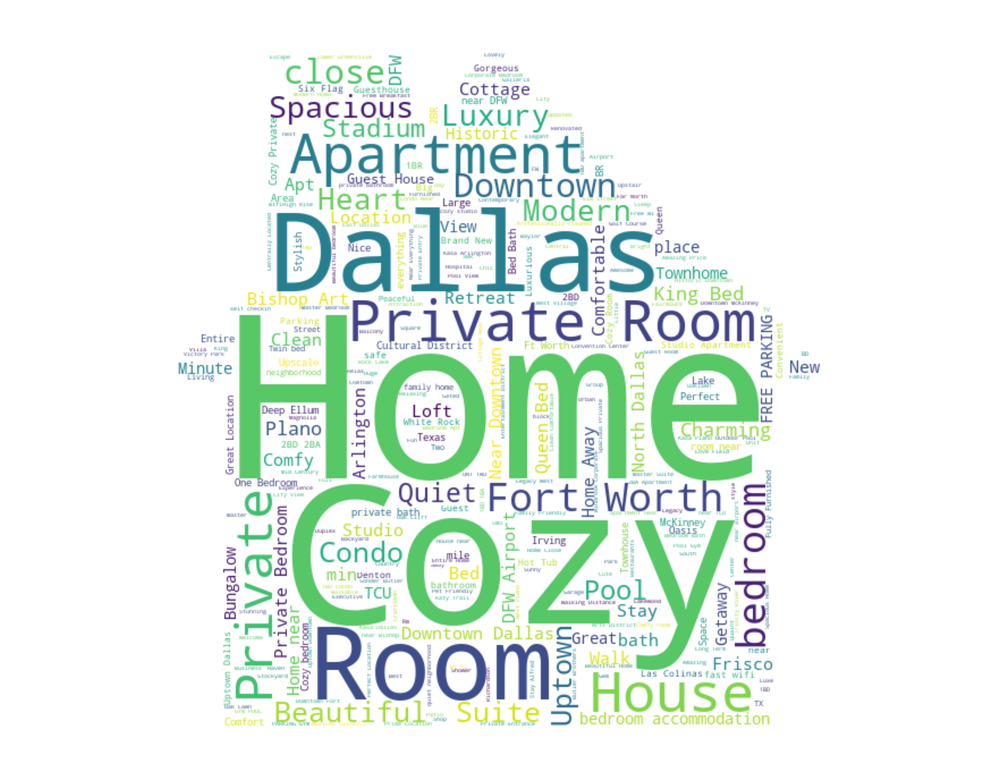

In [67]:
# Objective 12: word cloud
import numpy as np
import pandas as pd
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

mask = np.array(Image.open("img/house.png"))

# def transform_format(val):
#     if val == 0:
#         return 255
#     else:
#         return val
# # Transform your mask into a new one that will work with the function:
# transformed_house_mask = np.ndarray((house_mask.shape[0],house_mask.shape[1]), np.int32)


# for i in range(len(house_mask)):
#     transformed_house_mask[i] = list(map(transform_format, house_mask[i]))
# transformed_house_mask
# # # Create a word cloud image

property_listings_df = pd.read_csv('data/property_listings.csv')

titles = " ".join(title for title in property_listings_df.title)

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=STOPWORDS, max_words=500, background_color="white", mask=mask, max_font_size=256,
               random_state=42, width=mask.shape[1],
               height=mask.shape[0]).generate(titles)

# store to file
wordcloud.to_file("img/house_word_cloud.png")

# Display the generated image:
plt.figure(figsize=[200,100])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show